# Task 3 - Bit-error Control
### Ioana Lazar
#### Python 3

## \_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_ Helper functions & imports  \_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_

### Imports

In [1]:
from scipy.io import wavfile
from IPython import display as Dp
import numpy as np
from math import log10, sqrt
from scipy import special
from matplotlib import pyplot as plt

### * My functions

In [2]:
def compute_Eb_div_N0(transmission_pow, transmission_rate):
    """Compute the valule of Eb/N0 for given transmission power and for channel loss of 50dB
        The result is not in dB"""
    Eb_transmitter = transmission_pow / transmission_rate
    Eb_receiver = Eb_transmitter / 10**5
    N0 = 10 * 10**(-12)      # power spectral density of channel noise
    return Eb_receiver / N0

def not_dB(dB):
    """Convert from decibels to not decibels"""
    return 10**(dB/10)


def beP(Eb_div_N0):
    """Function that produces bit error probability for any given
        value of Eb/N0 when modulation technique is binary FSK"""
    return 0.5*special.erfc(np.sqrt(Eb_div_N0))

# Parsing function to extract PESQ score from text file after running linux_pesq
# code for this was taken from the example file (task 1)
def read_pesq_score():
    import os
    if os.path.exists("pesq_results.txt"):
        f = open ("pesq_results.txt","rb")
        firstline = f.readline()  # Ignore this line
        secondline = f.readline()
        #print(secondline)
        s = secondline.split()
        score = float(s[2])  # score is 2nd entry of 2nd line
        f.close()
        os.remove("pesq_results.txt")   # Delete text file
    else:
        print("There are no results from presq_main")
        score=0.0
    return score

def pretty_print(string, var, f="no_format", extra_string=""):
    """Print string and variable"""
    print()
    print(string, end='')
    if f == "no_format": 
        print(var, end='')
    else:
        print(f % var, end='')
    print(extra_string)
    print("___________________________________________________________________")
    print()
    print()
    
def print_section_title(t, var="", numbered="False", f="no_format"):
    print()
    print()
    print("___________________________________________________________________")
    print()
    if numbered != "False":
        print(numbered, end='. ')
    if var == "":
        print(t)
    else:
        print(t, end=' ')
        if f == "no_format": 
            print(var)
        else:
            print(f % var)
    print("___________________________________________________________________")
    print()
    
def count_ones(bit1, bit2, bit3):
    """Takes 3 bits and counts how many of them are 1"""
    count = 0
    if bit1 == 1:
        count += 1
    if bit2 == 1:
        count += 1
    if bit3 == 1:
        count += 1
    return count

def majority_voting(b_1,b_2,b_3):
    """Takes 3 bit arrays and simulates majority voting. 
        For each index, keep the value that occurs most frequently"""
    n = b_1.shape[0]    # size of all 3 arrays
        
    b_majority = np.zeros(n)    # the new array that will store the "winning" bits
        
    for i in range(n):
        num_of_1 = count_ones(b_1[i], b_2[i], b_3[i])
        b_majority[i] = 1 if num_of_1 > 1 else 0
    return b_majority.astype(np.int)

def compare_strings(s_1, s2):
    """Compares 2 strings and returns false if they are the same.
        Counts how many characters are different and prints stats."""
    s1=s_1.decode("ISO-8859-1")
    #s2=s_2.decode("ISO-8859-1")
    print("Original message\n", s1)
    print("\n\nReceived message\n", s2)
    diff_char = 0
    for c in range(len(s1)):
        if s1[c] != s2[c]:
            #print(s2[c], end=" ")
            diff_char += 1
    if diff_char > 0:
        print("\n\nNumber of wrong characters", diff_char)
        #return True    # it is true that the string are different
    else:
        print("\n\nNo wrong characters")
    #return False       # it is false that the strings are different (they are equal)

def request_transmission(message, CRC_transmitter, CRC_message, beP, fail_no=1, chase_cmb=False,b1=[],b2=[],b3=[]):
    print("\n\n\n")
    retransm_ack = "...............................Requesting transmission #" + str(fail_no+1) + "..............................."
    print(retransm_ack, end="\n\n")  

    # apply bit errors
    message_err_b = np.copy(CRC_message)
    message_err_b = insert_bit_errors(CRC_message, beP)
    
    if chase_cmb:
        print("\n\nRETRANSMISSION FAILED MORE THAN 3 TIMES")
        print("\n\033[1m DO CHASE COMBINING... \033[0m\n\n")
        # if had 3 failed transmissions and chase combining is used then 
        # get a new bit array by combining 3 failed transmissions
        message_err_b = majority_voting(b1,b2,b3)
        
    # get CRC at receiver
    message_at_receiver = replace_by_zero(message_err_b, np.size(CRC_transmitter))
    CRC_receiver = checkCRC(message_at_receiver, gx)
    
    print("CRC at transmitter: ",CRC_transmitter)
    print("CRC at receiver:    ", CRC_receiver)
    print()
        
    CRC_fail = False if np.array_equal(CRC_receiver, CRC_transmitter) else True
    
    # convert back to ascii
    message_err_ascii = bitarray_to_asciiString(message_at_receiver)
    #message_err_ascii = repr(message_err_ascii)

    # print some stats (e.g. how many characters were received incorrectly)
    compare_strings(message, message_err_ascii) # compares the two strings and see if they are the same
    if CRC_fail:
        print("\n\n\033[1m FAIL \033[0m")
        return CRC_fail, message_err_b
    else:
        print("\n\n\033[1m PASS \033[0m")
        return CRC_fail, message_err_b
    

def replace_by_zero(bits, n):
    """Replace last n bits by 0"""
    for b in range(np.size(bits)):
        if np.size(bits)-b <= n:
            bits[b] = 0
    return bits

### * Functions given in task 3 support

In [3]:
# Function to convert an ascii byte-string to a bitArray.
def asciiString_to_bitarray(bytestring):
    try:
        BA = np.unpackbits(bytearray(bytestring))
    except:
        BA = np.unpackbits(bytearray(bytestring,'latin1'))
    return BA

# Function to convert a bitarray to an ascii string.
def bitarray_to_asciiString(bitarray):
    NA=np.packbits(bitarray)
    NA=NA.tobytes()
    NA=NA.decode('latin1')
    return NA

# Convert np.int16 array to bit-Array
def numpyint16array_to_bitarray(D):       
    return np.unpackbits(bytearray(D.byteswap()))

# Function to convert a bitarray to a NumPy int16 array.
def bitarray_to_numpyint16array(data):
    NA=np.packbits(data)
    NA=NA.tobytes()
    NA=np.frombuffer(NA, dtype=np.int16)
    NA=NA.byteswap()
    return NA

# Function for inserting bit-errors into a bitarray
def insert_bit_errors(data, bit_error_probability):
    # Insert bit errors into some data with given probability.
    errors = np.random.uniform(size=data.size) < bit_error_probability
    return errors ^ data

# Function checkCRC for performing a CRC check
import numpy as np
def checkCRC(xa,gx) :  
    # Generates M-bit CRC as row-vector where length of gx is (M+1)
    # Generator polynomial of order M is represented by gx(0:M)
    # Message is bit-array xa(0:L)
    M = len(gx)-1
    #print ("M = ", M)
    xsa = np.copy(xa[0:M+1])  # Must use np.copy here
    for i in range (0 , len(xa) -(M)):
        xsa[M] = xa[i + M]
        if xsa[0] == gx[0]: 
            xsa = xsa ^ gx      
        xsa[0:M] = xsa[1:M+1]           
        #print(i, "xsa: ", xsa)   
    return xsa[0:M]

# Convert np.int16 array to bit-string (Not needed here )
def numpyint16array_to_bitstring(D):
    BS=np.unpackbits(bytearray(D.byteswap()))
    BS=BS.astype(str)                 
    return "".join(BS)

## \_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_

## \_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_\_

## Expt 3.1: Effect of transmit power on speech quality

Play out speech without bit errors.



Average energy per bit at the transmitter (measured in Joules)0.0000078125
___________________________________________________________________



Average enery per bit at the receiver (channel has loss of 50 dB)0.000000000078125
___________________________________________________________________



Signal power to noise power ratio in dB8.928
___________________________________________________________________




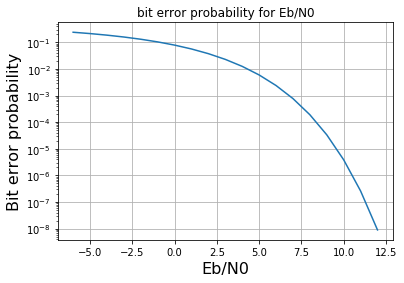

In [4]:
(Fs, speech) = wavfile.read('NarrobandSpeech8k.wav')

print("Play out speech without bit errors.")
Dp.display(Dp.Audio(speech, rate=Fs))

transmission_pow = 1      # watt (joule/s)
transmission_rate = 128000 # 128 kbit/s

# compute the average energy per bit (Eb) at the transmitter
Eb_transmitter = transmission_pow / transmission_rate
pretty_print("Average energy per bit at the transmitter (measured in Joules)", Eb_transmitter, f="%.10f")

# computer the average energy per bit at the receiver
# assume a 50 dB loss over the channel
Eb_receiver = Eb_transmitter / 10**5
pretty_print("Average enery per bit at the receiver (channel has loss of 50 dB)", Eb_receiver, f="%.15f")

N0 = 10 * 10**(-12)      # power spectral density of channel noise
Eb_div_N0_dB = 10*log10(Eb_receiver / N0)      # convert to dB
pretty_print("Signal power to noise power ratio in dB", Eb_div_N0_dB, f="%.3f")
bit_err_prob = beP(Eb_receiver / N0)     # calculate bit error probability to later introduce bit errors in speech


#-------------------------------------------------------------------------------------------------------- 
#------- Plot bit error probability for range -6 to +12 dB  that produces bit error probability ---------

Eb_div_N0_dB = np.arange(-6, 13)

Eb_div_N0 = not_dB(Eb_div_N0_dB)    # convert to not dB
beP_res = beP(Eb_div_N0)            # calculate bit error probability 

# plot beP against Eb/N0 (in dB)
fig, graph = plt.subplots(1, figsize = (6, 4))
graph.plot(Eb_div_N0_dB, beP_res)
graph.grid(True) ;  graph.set_title("bit error probability for Eb/N0")    
plt.xlabel('Eb/N0', fontsize=16)
plt.ylabel('Bit error probability', fontsize=16)
plt.yscale("log")

### Insert some bit errors

In [5]:
# first convert speech to bit array
bit_speech = numpyint16array_to_bitarray(speech)


print("Play out speech without bit errors.")
Dp.display(Dp.Audio(speech, rate=Fs))

#-------------------------------------------------------------------------------------------------------- 
#------------------------------- Effect of transmitting with power = 1 watt ----------------------------- 


print_section_title("TRANSMISSION POWER = 1 WATT + BIT ERRORS")

# insert some bit errors
bit_err_array = insert_bit_errors(bit_speech, bit_err_prob)

# reconstruct speech after inserting bit errors
bit_err_speech = bitarray_to_numpyint16array(bit_err_array)

print("Bit error probability is:")
print("%.10f" % bit_err_prob)
print()

print("Transmission power is 1 watt, insert some bit errors.")
Dp.display(Dp.Audio(bit_err_speech, rate=Fs))


#----------------------------------------------------
#----------- PESQ SCORE (1 watt) --------------------

# write error speech to file
wavfile.write("bitErrorSpeech.wav", Fs, bit_err_speech)

! ./linux_pesqmain +8000 NarrobandSpeech8k.wav bitErrorSpeech.wav> /dev/null
score = read_pesq_score()
print("PESQ score for speech with transmission power of 1 watt and some bit erros introduced -->", score)



#-------------------------------------------------------------------------------------------------------- 
#------------------------------- Effect of transmitting with power = 1.2 watt -----------------------------


print_section_title("TRANSMISSION POWER = 1.2 WATT + BIT ERRORS")

transmission_pow = 1.2     # watt (joule/s)

Eb_div_N0 = compute_Eb_div_N0(transmission_pow, transmission_rate)
bit_err_prob2 = beP(Eb_div_N0)

# insert some bit errors
bit_err_array2 = insert_bit_errors(bit_speech, bit_err_prob2)

# reconstruct speech after inserting bit errors
bit_err_speech2 = bitarray_to_numpyint16array(bit_err_array2)


print("Bit error probability is:")
print("%.10f" % bit_err_prob2)
print()

print("Increase power of transmission to 1.2 watt and insert some bit errors.")
Dp.display(Dp.Audio(bit_err_speech2, rate=Fs))


#----------------------------------------------------
#----------- PESQ SCORE (1.2 watt) --------------------

# write error speech to file
wavfile.write("bitErrorSpeech2.wav", Fs, bit_err_speech2)

! ./linux_pesqmain +8000 NarrobandSpeech8k.wav bitErrorSpeech2.wav> /dev/null
score2 = read_pesq_score()
print("PESQ score for speech with transmission power of 1.2 watt and some bit erros introduced -->", score2)

Play out speech without bit errors.




___________________________________________________________________

TRANSMISSION POWER = 1 WATT + BIT ERRORS
___________________________________________________________________

Bit error probability is:
0.0000386134

Transmission power is 1 watt, insert some bit errors.


PESQ score for speech with transmission power of 1 watt and some bit erros introduced --> 3.153


___________________________________________________________________

TRANSMISSION POWER = 1.2 WATT + BIT ERRORS
___________________________________________________________________

Bit error probability is:
0.0000074512

Increase power of transmission to 1.2 watt and insert some bit errors.


PESQ score for speech with transmission power of 1.2 watt and some bit erros introduced --> 3.765


### Questions

**1. How is the value of beP calculated for a given transmission power? Do you get the correct value for a power of 1 watt?**

The bit error probability is calculated as follows:
* compute average energy per bit at transmitter --> $Eb\ transmitter = \frac{transmission\ pow}{bit\ rate}$


* compute average energy per bit at the receiver --> $Eb\ receiver =\frac{Eb\ transmitter}{10^{5}}$ (loss of 50 dB)


* compute $\frac{Eb\ receiver}{N0}$ where N0 is the power spectral density of channel noise


* compute bit error probability --> $beP = 0.5 \times erfc(\sqrt{\frac{Eb}{N0}})$

**2. What is the quality of speech obtained when beP = 1? Explain your answer.**

See experiment below.

The quality is very high. If the bit error probability is 1 then all the bits will be flipped. Two things happen when beP is 1:
* the numbers that are converted to bits during tranmission will just be inverted (made negative if positive and vice versa) because of how ints are implemented as bits

* deviate the numbers by +/-1

So the sound will be exactly the same. If you play at the same time the original song and the song with all the bits inverted, they will cancel each other out.

**3. What is the new bit-error probability (for 1.2 watts)?**

The new bit error probability is 0.0000074512.

**4. What is the PESQ score for the narrowband speech transmitted with 1.2 watts?**

The score is roughly 3.9

**5. How is the talk time affected?**

**The higher the transmission power the lower the talk time**. If we assume that phone battery holds 18000 joules and transmission power is **1.2 watts**, then we get 18000/1.2 seconds of talk time. That is 15000 seconds, which is **4 hours and 10 minutes**.

If power is **1 watt** we get 18000 seconds = **5 hours**.

**6. Explain in about one sentence how battery life and bit-error rates are connected.**

If the bit error rate is high, then it is more likely that there are a lot of bit errors when a signal/message is being transmitted. So retransmission might be neccessary. It takes energy to retransmit a signal, so the more retransmissions are required, the faster the battery will run out.

### What happens if bit error probability is 1?

In [6]:
print_section_title("BIT ERROR PROBABILITY IS 1")

bit_err_array3 = insert_bit_errors(bit_speech, 1)

# reconstruct speech after inserting bit errors
bit_err_speech3 = bitarray_to_numpyint16array(bit_err_array3)

Dp.display(Dp.Audio(bit_err_speech3, rate=Fs))


#----------------------------------------------------
#----------- PESQ SCORE -----------------------------

# write error speech to file
wavfile.write("bitErrorSpeech3.wav", Fs, bit_err_speech3)

! ./linux_pesqmain +8000 NarrobandSpeech8k.wav bitErrorSpeech3.wav> /dev/null
score = read_pesq_score()
print("PESQ score for speech with transmission power of 1 watt and bit error probability of 1 -->", score)




___________________________________________________________________

BIT ERROR PROBABILITY IS 1
___________________________________________________________________



PESQ score for speech with transmission power of 1 watt and bit error probability of 1 --> 4.5


## Expt 3.2: Effect of beP on narrow-band speech without FEC

In [7]:
# introduce evenly distributed bit erros on narrow band speech

(Fs, speech) = wavfile.read('NarrobandSpeech8k.wav')
print("Play out speech without bit errors.")
Dp.display(Dp.Audio(speech, rate=Fs))

bit_speech = numpyint16array_to_bitarray(speech)
bit_err_prob = np.geomspace(0.00001, 0.01, num=13)

# array to keep the PESQ score
scores = np.zeros(13)

# produce 13 different versions of speech file
for v in range (0,13):
    print_section_title("BIT ERROR PROBABILIY IS", bit_err_prob[v], numbered=v+1, f="%.7f")
    
    bit_err_array = insert_bit_errors(bit_speech, bit_err_prob[v])
    bit_err_speech = bitarray_to_numpyint16array(bit_err_array)
    
    print("Damaged speech:")
    Dp.display(Dp.Audio(bit_err_speech, rate=Fs))
    
    #----------------------------------------------------
    #----------- PESQ SCORE -----------------------------

    # write error speech to file
    wavfile.write("bitErrorSpeech.wav", Fs, bit_err_speech)

    ! ./linux_pesqmain +8000 NarrobandSpeech8k.wav bitErrorSpeech.wav> /dev/null
    scores[v] = read_pesq_score()
    print("PESQ score for damaged speech -->", scores[v])
 

Play out speech without bit errors.




___________________________________________________________________

1. BIT ERROR PROBABILIY IS 0.0000100
___________________________________________________________________

Damaged speech:


PESQ score for damaged speech --> 3.851


___________________________________________________________________

2. BIT ERROR PROBABILIY IS 0.0000178
___________________________________________________________________

Damaged speech:


PESQ score for damaged speech --> 3.818


___________________________________________________________________

3. BIT ERROR PROBABILIY IS 0.0000316
___________________________________________________________________

Damaged speech:


PESQ score for damaged speech --> 3.39


___________________________________________________________________

4. BIT ERROR PROBABILIY IS 0.0000562
___________________________________________________________________

Damaged speech:


PESQ score for damaged speech --> 3.193


___________________________________________________________________

5. BIT ERROR PROBABILIY IS 0.0001000
___________________________________________________________________

Damaged speech:


PESQ score for damaged speech --> 2.764


___________________________________________________________________

6. BIT ERROR PROBABILIY IS 0.0001778
___________________________________________________________________

Damaged speech:


PESQ score for damaged speech --> 2.168


___________________________________________________________________

7. BIT ERROR PROBABILIY IS 0.0003162
___________________________________________________________________

Damaged speech:


PESQ score for damaged speech --> 1.958


___________________________________________________________________

8. BIT ERROR PROBABILIY IS 0.0005623
___________________________________________________________________

Damaged speech:


PESQ score for damaged speech --> 1.435


___________________________________________________________________

9. BIT ERROR PROBABILIY IS 0.0010000
___________________________________________________________________

Damaged speech:


PESQ score for damaged speech --> 1.343


___________________________________________________________________

10. BIT ERROR PROBABILIY IS 0.0017783
___________________________________________________________________

Damaged speech:


PESQ score for damaged speech --> 1.318


___________________________________________________________________

11. BIT ERROR PROBABILIY IS 0.0031623
___________________________________________________________________

Damaged speech:


PESQ score for damaged speech --> 1.427


___________________________________________________________________

12. BIT ERROR PROBABILIY IS 0.0056234
___________________________________________________________________

Damaged speech:


PESQ score for damaged speech --> 1.51


___________________________________________________________________

13. BIT ERROR PROBABILIY IS 0.0100000
___________________________________________________________________

Damaged speech:


PESQ score for damaged speech --> 1.492


### Plot bit error probability against PESQ score

Text(0, 0.5, 'Bit error probability')

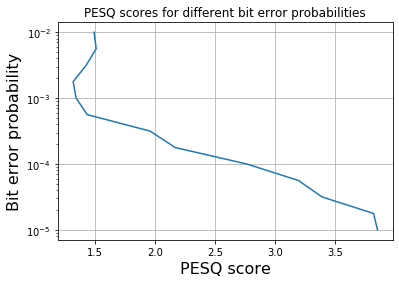

In [8]:
fig, graph = plt.subplots(1, figsize = (6, 4))
graph.plot(scores, bit_err_prob)
graph.grid(True) ;  graph.set_title("PESQ scores for different bit error probabilities")    
plt.yscale("log")
plt.xlabel('PESQ score', fontsize=16)
plt.ylabel('Bit error probability', fontsize=16)

### Questions

**1. How did you choose the values of beP to produce a logarithmic horizontal scale?.**

I just used the geomspace function to get values between 0.00001 and 0.01 on a logarithimc scale.

**2. How do the changes in beP affect the quality of the sound as you listen to it?**

The sound quality gets worse as the bit error probability increases. There is a noticeable "pop" sound that occurs more freuquently when the beP is higher.

**3. What is the effect of bit-errors on the sound?**

I just explained this above. The sound starts to "crackle". The speech however is still intelligible.

**4. How do the changes in beP affect the speech quality as assessed by PESQ?**

The score becomes smaller as the beP increases.

**5. Do the PESQ scores agree with your perception of the speech quality?**

After listening to the sound bars produces, I got the impression that the speech was unaffected. It remained intelligible. The popping sounds could be heard in the background, but the speech did not really change at all.

**6. Could any non-zero values of beP be tolerated during a mobile telephone conversation?**

Yes. Based on these experiments, I noticed that intelligibility is not affected much by bit errors (if the bit error probability is negligible). Very small bit errors wouldn't have a great impact.

## Expt 3.3: Effect of beP on narrow-band speech with simple FEC scheme

In [9]:
(Fs, speech) = wavfile.read('NarrobandSpeech8k.wav')
print("Play out speech without bit errors.")
Dp.display(Dp.Audio(speech, rate=Fs))

bit_speech = numpyint16array_to_bitarray(speech)
bit_err_prob = np.geomspace(0.00001, 0.01, num=13)

# array to keep the PESQ score when we use FEC
scores_FEC = np.zeros(13)

# produce 13 different versions of speech file
for v in range (0,13):
    print_section_title("BIT ERROR PROBABILIY IS", bit_err_prob[v], numbered=v+1, f="%.7f")
    
    # get 3 bit error arrays
    bit_err1 = insert_bit_errors(bit_speech, bit_err_prob[v])
    bit_err2 = insert_bit_errors(bit_speech, bit_err_prob[v])
    bit_err3 = insert_bit_errors(bit_speech, bit_err_prob[v])
    
    # obtain final bit array by picking the most frequent bits
    bit_err_array = majority_voting(bit_err1, bit_err2, bit_err3)
  
    bit_err_speech = bitarray_to_numpyint16array(bit_err_array)
    
    print("Damaged speech:")
    Dp.display(Dp.Audio(bit_err_speech, rate=Fs))
    
    #----------------------------------------------------
    #----------- PESQ SCORE -----------------------------

    # write error speech to file
    wavfile.write("bitErrorSpeech.wav", Fs, bit_err_speech)

    ! ./linux_pesqmain +8000 NarrobandSpeech8k.wav bitErrorSpeech.wav> /dev/null
    scores_FEC[v] = read_pesq_score()
    print("PESQ score for damaged speech -->", scores_FEC[v])

Play out speech without bit errors.




___________________________________________________________________

1. BIT ERROR PROBABILIY IS 0.0000100
___________________________________________________________________

Damaged speech:


PESQ score for damaged speech --> 4.5


___________________________________________________________________

2. BIT ERROR PROBABILIY IS 0.0000178
___________________________________________________________________

Damaged speech:


PESQ score for damaged speech --> 4.5


___________________________________________________________________

3. BIT ERROR PROBABILIY IS 0.0000316
___________________________________________________________________

Damaged speech:


PESQ score for damaged speech --> 4.5


___________________________________________________________________

4. BIT ERROR PROBABILIY IS 0.0000562
___________________________________________________________________

Damaged speech:


PESQ score for damaged speech --> 4.5


___________________________________________________________________

5. BIT ERROR PROBABILIY IS 0.0001000
___________________________________________________________________

Damaged speech:


PESQ score for damaged speech --> 4.5


___________________________________________________________________

6. BIT ERROR PROBABILIY IS 0.0001778
___________________________________________________________________

Damaged speech:


PESQ score for damaged speech --> 4.5


___________________________________________________________________

7. BIT ERROR PROBABILIY IS 0.0003162
___________________________________________________________________

Damaged speech:


PESQ score for damaged speech --> 4.486


___________________________________________________________________

8. BIT ERROR PROBABILIY IS 0.0005623
___________________________________________________________________

Damaged speech:


PESQ score for damaged speech --> 4.198


___________________________________________________________________

9. BIT ERROR PROBABILIY IS 0.0010000
___________________________________________________________________

Damaged speech:


PESQ score for damaged speech --> 4.352


___________________________________________________________________

10. BIT ERROR PROBABILIY IS 0.0017783
___________________________________________________________________

Damaged speech:


PESQ score for damaged speech --> 3.637


___________________________________________________________________

11. BIT ERROR PROBABILIY IS 0.0031623
___________________________________________________________________

Damaged speech:


PESQ score for damaged speech --> 3.505


___________________________________________________________________

12. BIT ERROR PROBABILIY IS 0.0056234
___________________________________________________________________

Damaged speech:


PESQ score for damaged speech --> 2.859


___________________________________________________________________

13. BIT ERROR PROBABILIY IS 0.0100000
___________________________________________________________________

Damaged speech:


PESQ score for damaged speech --> 1.761


### Plot bit error probability against PESQ score (with FEC scheme)

Text(0, 0.5, 'Bit error probability')

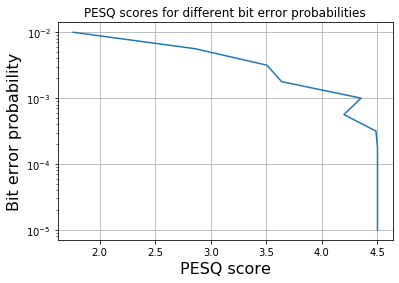

In [10]:
fig, graph = plt.subplots(1, figsize = (6, 4))
graph.plot(scores_FEC, bit_err_prob)
graph.grid(True) ;  graph.set_title("PESQ scores for different bit error probabilities")    
plt.yscale("log")
plt.xlabel('PESQ score', fontsize=16)
plt.ylabel('Bit error probability', fontsize=16)

### Compare graphs (without FEC vs. with FEC) 

Text(0, 0.5, 'Bit error probability')

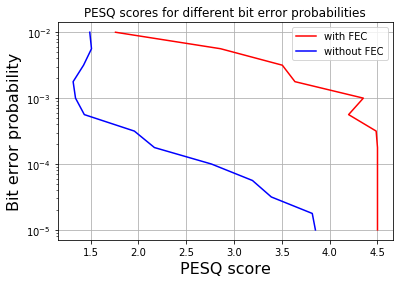

In [11]:
fig, graph = plt.subplots(1, figsize = (6, 4))
graph.plot(scores_FEC, bit_err_prob, 'r', label="with FEC")
graph.plot(scores, bit_err_prob, 'b', label="without FEC")
plt.legend(loc="upper right")
graph.grid(True) ;  graph.set_title("PESQ scores for different bit error probabilities")    
plt.yscale("log")
plt.xlabel('PESQ score', fontsize=16)
plt.ylabel('Bit error probability', fontsize=16)

### Questions

**1. When listening to the sound-bars, do you notice any improvement in narrow-band quality that is obtained at the expense of the 3-fold increase in transmitted bits.**

Yes, the quality is substantially better.

**2. To what extent does the combined PESQ graph agree with your perception of the speech quality?**

The PESQ score reflect the increase in quality. The scores are much higher --> above 4 for bit error up to 0.001. Previously, a bit error probability of 0.001 produced a PESQ score of 1.348, whereas now the score is 4.285.

**3. What is the effect of the 3-fold increase in transmitted bits on (i) the transmit power and (ii) the energy required to transmit the chosen section of narrowband speech?**

Power and energy increase 3-fold.

**4. What is the energy required and the PESQ score obtained with FEC when the transmit power is 1.2 watts?**

Around 0.00003 $\frac{joules}{bit}$.

Calculation: $\frac{1.2 watt}{128000 \frac{b}{s}}$ 

**5. If we now reduce the transmit power by a factor of 3 from 1.2 watts to 0.4 watts, how will the energy for the speech transmission be affected? [Show that the value of Eb/N0 reduces
by 10xlog10(3) = 4.8 dB, and remember this mathematical trick in future]. Calculate the new value of Eb/N0 and demonstrate the speech quality obtained for the (3,1) rep coder with this new value of Eb/N0.**

See experiment below.

**6. What other method could be used to reduce the energy required to transmit the speech sentence without reducing the energy per bit? Think about previous lectures.**

If the bit rate of speech is reduced then less energy is required because less bits are being sent per unit of time.

### Energy required for transmission experiment

In [12]:
(Fs, speech) = wavfile.read('NarrobandSpeech8k.wav')

# total number of bits
bits = speech.shape[0] * 16

transmission_rate = 128000 # 128 kbit/s

# calculate the energy per bit for power 1.2
e_bit1 = 1.2 / transmission_rate

# calculate the energy per bit for power 0.4
e_bit2 = 0.4 / transmission_rate

pretty_print("Energy required to transmit speech at power of 1.2 watts without FEC is: ", bits*e_bit1, extra_string=" joules", f="%.3f")
pretty_print("Energy required to transmit speech at power of 0.4 watts without FEC is: ", bits*e_bit2, extra_string=" joules", f="%.3f")
print()
print()
pretty_print("Energy required to transmit speech at power of 1.2 watts with FEC is: ", bits*e_bit1*3, extra_string=" joules", f="%.3f")
pretty_print("Energy required to transmit speech at power of 0.4 watts with FEC is: ", bits*e_bit2*3, extra_string=" joules", f="%.3f")



Energy required to transmit speech at power of 1.2 watts without FEC is: 26.400 joules
___________________________________________________________________



Energy required to transmit speech at power of 0.4 watts without FEC is: 8.800 joules
___________________________________________________________________





Energy required to transmit speech at power of 1.2 watts with FEC is: 79.200 joules
___________________________________________________________________



Energy required to transmit speech at power of 0.4 watts with FEC is: 26.400 joules
___________________________________________________________________




## Expt 3.4: Apply ARQ to a text message

In [13]:
message = b"Uncorrected bit-errors should never be allowed to affect email transmissions, text messages, documents and spreadsheets."
# convert message to bit array
message_b = asciiString_to_bitarray(message)
message_b_zeros = np.append(message_b, np.array([0,0,0,0,0,0,0,0],dtype=np.bool)) # append zeros at the end of it

# generator polynomial
gx = [1, 0, 0, 0, 0, 0, 1, 1, 1]
gx = np.array(gx,dtype=np.bool)

CRC_transmitter = checkCRC(message_b_zeros, gx)
CRC_len = np.size(CRC_transmitter)

# append check to the bit array that represents the message
message_CRC = np.append(message_b, CRC_transmitter)

bit_err_prob = np.geomspace(0.0001, 0.1, num=10)

for v in range (0,10):
   
    print_section_title("BIT ERROR PROBABILIY IS", bit_err_prob[v], numbered=v+1, f="%.5f")
    times_failed = 0
    transmit = True
    while transmit:
        if times_failed > 9:
            break;
        CRC_fail, s = request_transmission(message, CRC_transmitter, message_CRC, bit_err_prob[v], fail_no=times_failed)
        if CRC_fail:
            times_failed += 1
            transmit = True   # request transmission again
        else:
            times_failed = 0  # reset failure counter
            transmit = False



___________________________________________________________________

1. BIT ERROR PROBABILIY IS 0.00010
___________________________________________________________________





...............................Requesting transmission #1...............................

CRC at transmitter:  [1 1 1 1 1 0 0 0]
CRC at receiver:     [1 1 1 1 1 0 0 0]

Original message
 Uncorrected bit-errors should never be allowed to affect email transmissions, text messages, documents and spreadsheets.


Received message
 Uncorrected bit-errors should never be allowed to affect email transmissions, text messages, documents and spreadsheets. 


No wrong characters


 PASS 


___________________________________________________________________

2. BIT ERROR PROBABILIY IS 0.00022
___________________________________________________________________





...............................Requesting transmission #1...............................

CRC at transmitter:  [1 1 1 1 1 0 0 0]
CRC at receiver:     [1 1 1 1 1 

CRC at transmitter:  [1 1 1 1 1 0 0 0]
CRC at receiver:     [0 0 1 0 1 0 1 1]

Original message
 Uncorrected bit-errors should never be allowed to affect email transmissions, text messages, documents and spreadsheets.


Received message
 Uncorrected bit-errors0should never be allowed to affect"email transmissions, text mdssages, documents and spreadsheets. 


Number of wrong characters 3


 FAIL 


___________________________________________________________________

7. BIT ERROR PROBABILIY IS 0.01000
___________________________________________________________________





...............................Requesting transmission #1...............................

CRC at transmitter:  [1 1 1 1 1 0 0 0]
CRC at receiver:     [1 0 1 1 1 0 0 1]

Original message
 Uncorrected bit-errors should never be allowed to affect email transmissions, text messages, documents and spreadsheets.


Received message
 Uncorrected bit-errors s`oqld ~erer be allgwed to affgct email traosmisóions, text mewsages, 

CRC at transmitter:  [1 1 1 1 1 0 0 0]
CRC at receiver:     [1 1 1 1 0 1 0 1]

Original message
 Uncorrected bit-errors should never be allowed to affect email transmissions, text messages, documents and spreadsheets.


Received message
 Uncorrecôed!byt-errors should nEver bd aLlowed tO affect email transmisñions, text meówages.(docsments and0sppeadsheetq. 


Number of wrong characters 17


 FAIL 




...............................Requesting transmission #7...............................

CRC at transmitter:  [1 1 1 1 1 0 0 0]
CRC at receiver:     [0 1 0 1 0 0 1 0]

Original message
 Uncorrected bit-errors should never be allowed to affect email transmissions, text messages, documents and spreadsheets.


Received message
 Õnco2rectel bit-errors shoqld Nmvur!be allkwed to affect email transmissions, tExt meócag%s, documunds and spbe`esheets. 


Number of wrong characters 20


 FAIL 




...............................Requesting transmission #8...............................

CRC at tra

CRC at transmitter:  [1 1 1 1 1 0 0 0]
CRC at receiver:     [1 1 1 0 1 1 0 0]

Original message
 Uncorrected bit-errors should never be allowed to affect email transmissions, text messages, documents and spreadsheets.


Received message
 ULaïRrEãtåa bmü)eròr3$vhoul$"lGfeò bl0alloeedd4 QffUkt e­¥il 4òqnsi¹Bs©ow®0ügxT-l÷saemw,¡DOceíeotq i.Dspsehdqh%g4sn 


Number of wrong characters 74


 FAIL 




...............................Requesting transmission #9...............................

CRC at transmitter:  [1 1 1 1 1 0 0 0]
CRC at receiver:     [1 0 1 1 0 1 0 1]

Original message
 Uncorrected bit-errors should never be allowed to affect email transmissions, text messages, documents and spreadsheets.


Received message
 Uncopòegô5e zit-grâov3 sloq,d"nevep "e&!l|oged vo!asfgbt eM!il dzansLhswiony$(tåyt4i%ssÇem3.2ä/ê5m.|s ag` s8pe!g?heEtC. 


Number of wrong characters 66


 FAIL 




...............................Requesting transmission #10...............................

CRC at tr

### Questions:

**1. If the CRC check succeeds, can we deduce that there are no bit-errors? Briefly explain your answer**

If the CRC succeeds, it is not necessarily the case that there are no bit-errors. This is because CRC is based on division. If the introduced bit errors happen to be a multiple of the message transmitted, then the CRC check will be the same (because only the remainder is kept). Since the CRC is the same, it will pass even though the message actually contains errors.

**2. If the CRC check fails, can we deduce that there are some bit-errors? Briefly explain your answer**

This is also not necessarily true. It is possible that bit errors are only introduced in the CRC when transmission is done and all other bits (the ones in the actual message) are transmitted without error.

**3. Explain how your results demonstrate the effect of evenly distributed bit-errors and ARQ with various values of bit-error probability.**

After closely analyzing the output, I noticed that the erros are evenly distributed in the string. No burst errors can be noticed, i.e. errors do not occur in the same part of the string, but rather they are spread out accross the string.

**4. For what values of bit-error probability did the ARQ process fail completely after 9 transmissions?**

For probabilities **higher than 0.04**.

**5. If the CRC check fails for the first three transmissions, does it appear likely, from your experiments, that a further retransmission will be successful?**

It is unlikely that it will be successful after three transmissions (based on observation of the results).

**6. If a message has about 125 characters represented by 1000 bits, the probability that it will be received correctly in one transmission if beP = 0.001 will be 0.999^1000 =(aprox) 0.37. What is the probability that it will not be received correctly after 5 transmissions?**

The probability that a transmission is received incorrectly is 1 - 0.37 = 0.63. The probability that the transmission is received incorrectly after 5 transmissions is ${0.63}^{5} = 0.0992$

## Expt 3.5: Applying a modified form of ARQ to a text message

In [14]:
l = np.size(message_CRC)*3

for v in range (0,10):
    print_section_title("BIT ERROR PROBABILIY IS", bit_err_prob[v], numbered=v+1, f="%.5f")
    times_failed = 0
    transmit = True
    failed_arr = np.zeros(0)      # accumulate failed tranmissions here
    while transmit:
        # allow to fail up to three times, on fourth retransmission do chase combining
        if times_failed >= 3:
            # if retransmission fails more than 3 times, do chase combining
            # take the 3 bit arrays that failed and apply majority voting, i.e. keep the bits that occur most often
            b1 = failed_arr[0:int(l/3)]
            b2 = failed_arr[int(l/3):int(2*l/3)]
            b3 = failed_arr[int(2*l/3):int(l)]
            CRC_fail, wrong_mess = request_transmission(message, CRC_transmitter, message_CRC, bit_err_prob[v], fail_no=times_failed, chase_cmb=True,b1=b1,b2=b2,b3=b3)
            break;
        else:
            CRC_fail, wrong_mess = request_transmission(message, CRC_transmitter, message_CRC, bit_err_prob[v], fail_no=times_failed)
        
        if CRC_fail:
            times_failed += 1
            transmit = True   # request transmission again
            failed_arr = np.append(failed_arr, wrong_mess)
            
        else:
            times_failed = 0  # reset failure counter
            transmit = False



___________________________________________________________________

1. BIT ERROR PROBABILIY IS 0.00010
___________________________________________________________________





...............................Requesting transmission #1...............................

CRC at transmitter:  [1 1 1 1 1 0 0 0]
CRC at receiver:     [1 1 1 1 1 0 0 0]

Original message
 Uncorrected bit-errors should never be allowed to affect email transmissions, text messages, documents and spreadsheets.


Received message
 Uncorrected bit-errors should never be allowed to affect email transmissions, text messages, documents and spreadsheets. 


No wrong characters


 PASS 


___________________________________________________________________

2. BIT ERROR PROBABILIY IS 0.00022
___________________________________________________________________





...............................Requesting transmission #1...............................

CRC at transmitter:  [1 1 1 1 1 0 0 0]
CRC at receiver:     [0 0 0 0 1 

___________________________________________________________________





...............................Requesting transmission #1...............................

CRC at transmitter:  [1 1 1 1 1 0 0 0]
CRC at receiver:     [1 1 0 1 1 1 0 0]

Original message
 Uncorrected bit-errors should never be allowed to affect email transmissions, text messages, documents and spreadsheets.


Received message
 Õncoòrected bit-errors should nuver bg allo÷ed to afvect emAml transmisshons, pext lessqge3, documqnus and cpzeadshegts. 


Number of wrong characters 19


 FAIL 




...............................Requesting transmission #2...............................

CRC at transmitter:  [1 1 1 1 1 0 0 0]
CRC at receiver:     [0 1 1 0 0 1 0 0]

Original message
 Uncorrected bit-errors should never be allowed to affect email transmissions, text messages, documents and spreadsheets.


Received message
 Uncmrracpef biô-evror{ should neveò¡bE allo÷ed to uffEcv email traos}issions( text e%ssage3, $cumånts i

### Questions:

**1. What could the ARQ mechanism above do if a numerical or string array is received correctly but bit-errors have occurred in the CRC check-bits? How often might this occur?**

Retransmission is request if the CRC check bits at the received are different from those at the transmitter. It might happen that bit errors occur in the CRC. This would not be detected by my implementation becuse there is a very low chance this might happen. If this happens however, then retransmission might mistakenly be requested, when in reality the array was received correctly.

**2. State whether you consider ARQ as used in Expt 3.4 an efficient method, and explain the reasons for your answer.**

The method used in 3.4 is fairly efficient. Retransmission is only requested if the CRC fails. Only up to 9 retransmissions are allowed because once it fails this many times, it is very unlikely that future retransmissions will pass.

**3. Explain your mechanism for combining failed retransmissions.**

I allowed a retransmission to fail up to three times. The erronous bit arrays that resulted from these failed retransmissions were kept so that they could later be combined to produce a new (maybe less erronous) array. After a third failed retransmission, on the fourth retransmission I combined the three previously obtained erronous arrays. I used majority voting so as to keep the bits that occured most often.

**4. Demonstrate the effect of combining 3 failed transmissions.**

See demonstration below. This is also obvious by comparing the results in exp 3.4 to those in exp 3.5. The latter yields much better results.

**5. At what value of beP does the new ARQ process fail completely? Is there any improvement over what we got before?**

For probability **0.01 and higher**, three retransmissions + chase combining on the fourth is not enough to get the correct message. This might vary. The statement was based on observing what happens if I run it one time.


**6. If combining failed transmissions turns out to be a good idea, why is it not used in practice, for example in wifi (you need to look this up).**

The decrease in failure brought by this technique is not worth the overhead of retaining the state so that retransmissions can be combined.

### Demonstration of combining 3 failed transmissions

For a bit error probability of 0.1, I will demonstrate the difference between an implementation that uses chase combining and one that does not. On the 4th retransmission (if it is the case that 4 retransmissions will be required), I will combine 3 failed transmissions in one case and in the other case I will allow retransmission to happen as before. 

When 3 failed transmissions are combined and the message is transmitted again, the number of wrong characters is **smaller** than the case when chase combining is not applied.

In [15]:
beP=0.1
times_failed = 0
transmit = True
failed_arr = np.zeros(0)      # accumulate failed tranmissions here

print_section_title("BIT ERROR PROBABILIY IS", beP)

while transmit:
        # allow to fail up to three times, on fourth retransmission do chase combining
        if times_failed >= 3:
            # if retransmission fails more than 3 times, do chase combining
            # take the 3 bit arrays that failed and apply majority voting, i.e. keep the bits that occur most often
            b1 = failed_arr[0:int(l/3)]
            b2 = failed_arr[int(l/3):int(2*l/3)]
            b3 = failed_arr[int(2*l/3):int(l)]
            # do chase combining
            CRC_fail, wrong_mess = request_transmission(message, CRC_transmitter, message_CRC, beP, fail_no=times_failed, chase_cmb=True,b1=b1,b2=b2,b3=b3)
            # NO chase combining
            print_section_title("NO CHASE COMBINING")
            CRC_fail, wrong_mess = request_transmission(message, CRC_transmitter, message_CRC, beP, fail_no=times_failed)
            break;
        else:
            CRC_fail, wrong_mess = request_transmission(message, CRC_transmitter, message_CRC, beP, fail_no=times_failed)
        
        if CRC_fail:
            times_failed += 1
            transmit = True   # request transmission again
            failed_arr = np.append(failed_arr, wrong_mess)
            
        else:
            times_failed = 0  # reset failure counter
            transmit = False



___________________________________________________________________

BIT ERROR PROBABILIY IS 0.1
___________________________________________________________________





...............................Requesting transmission #1...............................

CRC at transmitter:  [1 1 1 1 1 0 0 0]
CRC at receiver:     [1 1 1 0 1 1 0 1]

Original message
 Uncorrected bit-errors should never be allowed to affect email transmissions, text messages, documents and spreadsheets.


Received message
 T.ãMrrdltel(àá4-'`rors"shmt-e ne~ezfd aìLOced(tokffekt umEi, tran3]a#sion3L4Eext mí1k!gds dOge}evT{ aîå Sq²gydsie4s> 


Number of wrong characters 67


 FAIL 




...............................Requesting transmission #2...............................

CRC at transmitter:  [1 1 1 1 1 0 0 0]
CRC at receiver:     [1 0 0 1 1 0 0 0]

Original message
 Uncorrected bit-errors should never be allowed to affect email transmissions, text messages, documents and spreadsheets.


Received message
 UFs